# HW4 EOF Analysis

In [1]:
### load module

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy import stats
from datetime import datetime
import matplotlib.dates as mdates
from xeofs.models import EOF, EOFRotator

## Open and Check Data

In [2]:
### open data

df = xr.open_dataset('../data/Homework4_January_1980-2016_Temp2m.nc')

### define the lans and lots for plotting
lons = df.longitudes[:]
lats = df.latitudes[:]
nt, nlat, nlon = df['temp2m'].shape
ngrd = nlon*nlat

### check data

df

<xarray.Dataset>
Dimensions:     (lat: 141, lon: 217, time: 37)
Dimensions without coordinates: lat, lon, time
Data variables:
    latitudes   (lat) float32 ...
    longitudes  (lon) float32 ...
    temp2m      (time, lat, lon) float32 ...
Attributes:
    description:  Homework4. SMASH. J.Eiras 2019

### 1. Do statistics for temperature data

* Calculate anomaly for every year for the given data

In [3]:
### calculate average on time
df_ave = df['temp2m'].mean('time')

### check the average
df_ave

<xarray.DataArray 'temp2m' (lat: 141, lon: 217)>
array([[271.84088, 271.8317 , 271.8197 , ..., 270.08856, 270.01147,
        269.96268],
       [271.9135 , 271.90732, 271.8981 , ..., 271.04315, 270.79346,
        270.83066],
       [271.9816 , 271.97687, 271.9699 , ..., 271.5646 , 271.4044 ,
        271.56357],
       ...,
       [298.18893, 298.158  , 298.1275 , ..., 299.56122, 299.597  ,
        299.6293 ],
       [298.07404, 298.04013, 298.00455, ..., 299.64722, 299.6809 ,
        299.7135 ],
       [298.01636, 297.98407, 297.94885, ..., 299.77322, 299.79706,
        299.8212 ]], dtype=float32)
Dimensions without coordinates: lat, lon

In [4]:
### calculate anomaly 
df_anom = df.temp2m - df_ave

### check the anomaly data
df_anom

<xarray.DataArray 'temp2m' (time: 37, lat: 141, lon: 217)>
array([[[ 0.70458984,  0.63204956,  0.55841064, ...,  0.8102417 ,
          0.87789917,  0.93118286],
        [ 0.78826904,  0.7711487 ,  0.7173767 , ...,  0.3540039 ,
          0.5298462 ,  0.5132141 ],
        [ 0.815094  ,  0.7886963 ,  0.7548218 , ...,  0.46051025,
          0.59729004,  0.46829224],
        ...,
        [ 0.21417236,  0.171875  ,  0.18933105, ...,  0.02801514,
          0.07211304,  0.0642395 ],
        [ 0.184021  ,  0.13665771,  0.13198853, ...,  0.03521729,
          0.03790283,  0.03781128],
        [ 0.15646362,  0.10852051,  0.10098267, ...,  0.074646  ,
          0.02593994,  0.02206421]],

       [[ 0.7288208 ,  0.7183533 ,  0.69955444, ...,  1.11026   ,
          1.1284485 ,  1.1405029 ],
        [ 0.7208557 ,  0.70602417,  0.6849365 , ...,  1.156189  ,
          1.1908264 ,  1.1615906 ],
        [ 0.7268982 ,  0.71255493,  0.7020874 , ...,  0.9894104 ,
          1.0073853 ,  0.96554565],
...
        [ 0.43548584,  0.4468689 ,  0.46969604, ..., -0.42269897,
         -0.43893433, -0.44049072],
        [ 0.44674683,  0.44458008,  0.4466858 , ..., -0.4446106 ,
         -0.45651245, -0.48330688],
        [ 0.4640808 ,  0.45285034,  0.4614563 , ..., -0.41888428,
         -0.4100952 , -0.44335938]],

       [[ 0.41711426,  0.41748047,  0.41436768, ..., -1.8717041 ,
         -2.0091248 , -2.116211  ],
        [ 0.38433838,  0.4055786 ,  0.41278076, ..., -1.405365  ,
         -1.5179138 , -1.4688416 ],
        [ 0.33825684,  0.3480835 ,  0.3673706 , ..., -1.0621643 ,
         -1.092865  , -0.9958496 ],
        ...,
        [ 2.8273315 ,  2.8064575 ,  2.7905884 , ...,  0.24606323,
          0.24005127,  0.252594  ],
        [ 2.947235  ,  2.9145203 ,  2.8986816 , ...,  0.23388672,
          0.24938965,  0.26242065],
        [ 3.0016785 ,  2.9591675 ,  2.9181824 , ...,  0.23529053,
          0.25582886,  0.29989624]]], dtype=float32)
Dimensions without coordinates: time, lat, lon

In [5]:
### date time dataset 
range_date = pd.date_range(start ='1/1/1980', end ='1/1/2016', 
                                                   freq ='AS')
print(range_date)

DatetimeIndex(['1980-01-01', '1981-01-01', '1982-01-01', '1983-01-01',
               '1984-01-01', '1985-01-01', '1986-01-01', '1987-01-01',
               '1988-01-01', '1989-01-01', '1990-01-01', '1991-01-01',
               '1992-01-01', '1993-01-01', '1994-01-01', '1995-01-01',
               '1996-01-01', '1997-01-01', '1998-01-01', '1999-01-01',
               '2000-01-01', '2001-01-01', '2002-01-01', '2003-01-01',
               '2004-01-01', '2005-01-01', '2006-01-01', '2007-01-01',
               '2008-01-01', '2009-01-01', '2010-01-01', '2011-01-01',
               '2012-01-01', '2013-01-01', '2014-01-01', '2015-01-01',
               '2016-01-01'],
              dtype='datetime64[ns]', freq='AS-JAN')


In [6]:
### assign coordinate for new created temperature anomaly
#tes = df_anom.assign_coords({"lon": ("lon", lons.values),
#                "lat": ("lat", lats.values), 
#                "time": ("time", range_date)})
df_anom_new = xr.DataArray(
    data=df_anom, 
    dims=["time", "lat", "lon"], 
    coords=dict(
        time=range_date,
        lat=("lat", lats.values),
        lon=("lon", lons.values),
    ),
    attrs=dict(
        description="Temp. Anomaly",
        units="degK"
    )
    )

print(df_anom_new)

<xarray.DataArray 'temp2m' (time: 37, lat: 141, lon: 217)>
array([[[ 0.70458984,  0.63204956,  0.55841064, ...,  0.8102417 ,
          0.87789917,  0.93118286],
        [ 0.78826904,  0.7711487 ,  0.7173767 , ...,  0.3540039 ,
          0.5298462 ,  0.5132141 ],
        [ 0.815094  ,  0.7886963 ,  0.7548218 , ...,  0.46051025,
          0.59729004,  0.46829224],
        ...,
        [ 0.21417236,  0.171875  ,  0.18933105, ...,  0.02801514,
          0.07211304,  0.0642395 ],
        [ 0.184021  ,  0.13665771,  0.13198853, ...,  0.03521729,
          0.03790283,  0.03781128],
        [ 0.15646362,  0.10852051,  0.10098267, ...,  0.074646  ,
          0.02593994,  0.02206421]],

       [[ 0.7288208 ,  0.7183533 ,  0.69955444, ...,  1.11026   ,
          1.1284485 ,  1.1405029 ],
        [ 0.7208557 ,  0.70602417,  0.6849365 , ...,  1.156189  ,
          1.1908264 ,  1.1615906 ],
        [ 0.7268982 ,  0.71255493,  0.7020874 , ...,  0.9894104 ,
          1.0073853 ,  0.96554565],
...
    

Text(0, 0.5, 'Temperature Anomaly (K)')

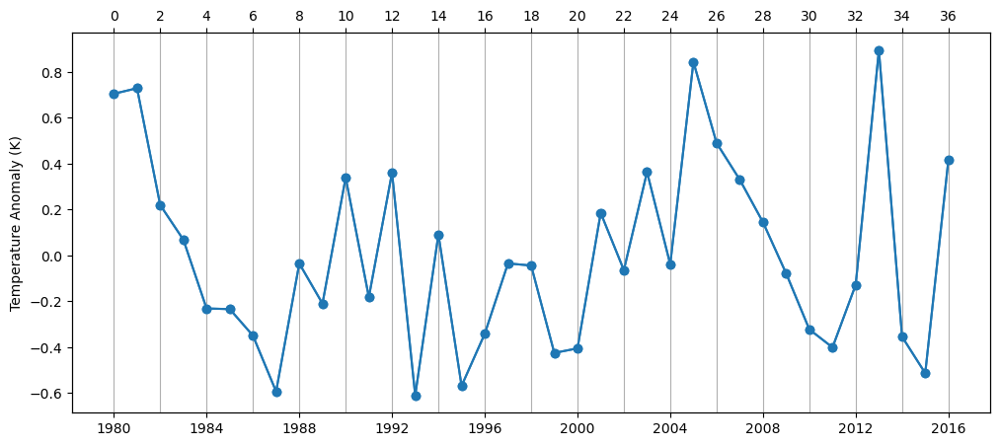

In [7]:
### check the year of anomaly by selecting random location
fig, ax = plt.subplots(figsize=(12,5))
ax2 = ax.twiny()
ax.plot(range_date, df_anom[:,0,0], marker='o')
ax2.plot(df_anom[:,0,0], marker='o')
ax2.set_xticks(np.arange(0, 38, 2))
ax2.grid(True)

ax.set_ylabel('Temperature Anomaly (K)')

January 2009 located on time = 29

* Show anomalies for January 2009

In [7]:
### set basemap 

from mpl_toolkits.basemap import Basemap

# set basemap
map = Basemap(llcrnrlon=min(lons), llcrnrlat=min(lats),
        urcrnrlon=max(lons), urcrnrlat=max(lats))
x, y = map(*np.meshgrid(lons, lats))

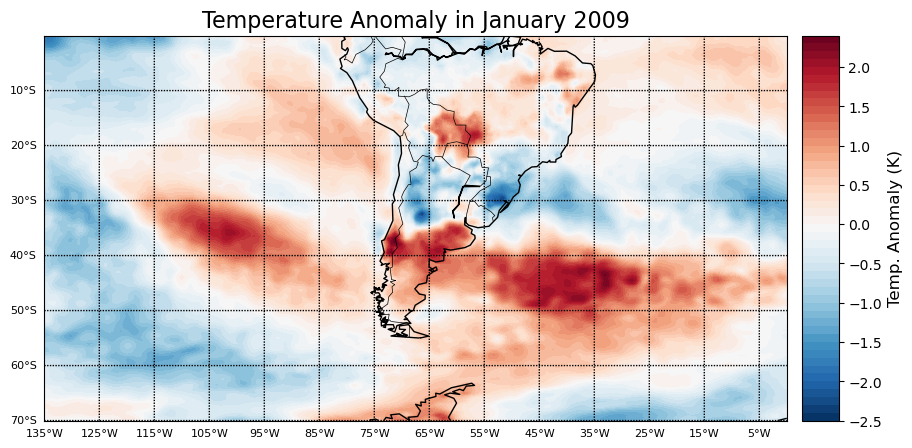

In [35]:
### plot the anomaly for January 2009
fig, ax = plt.subplots(figsize=(12,5))

# set colorbar
clevs = np.linspace(-2.5, 2.5, 50, endpoint=False)

# plot
cs = plt.contourf(x, y, df_anom[29], clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines()
map.drawcountries()

# plot ticks for map
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=8)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=8)

# plot legend
cb = map.colorbar(cs)
cb.set_label('Temp. Anomaly (K)', fontsize=12)
plt.title('Temperature Anomaly in January 2009', fontsize=16)

plt.show(block=False)

### 2. Perform EOF analysis

* Calculate covariance matrix

In [15]:
### determine the number (n)
n = df_anom.shape[0]
print("n = ", n)

### reshape the spatial dimension to calculate covvariance matriz
df_anom_rsp = df_anom.values.reshape(len(df.time), len(df.lat)*len(df.lon))
print(df_anom_rsp.shape)

### calculate covariance matrix
df_cov = np.cov(df_anom_rsp, rowvar=False)
print(df_cov)
print(df_cov.shape)

n =  37
(37, 30597)
[[0.16856917 0.16763299 0.16664135 ... 0.04589882 0.04515573 0.04844152]
 [0.16763299 0.16796946 0.16837479 ... 0.04219077 0.0419138  0.04510262]
 [0.16664135 0.16837479 0.17038092 ... 0.03796557 0.03820547 0.0412684 ]
 ...
 [0.04589882 0.04219077 0.03796557 ... 0.12167454 0.1191296  0.11962663]
 [0.04515573 0.0419138  0.03820547 ... 0.1191296  0.1183166  0.11990407]
 [0.04844152 0.04510262 0.0412684  ... 0.11962663 0.11990407 0.12395334]]
(30597, 30597)


* Calculate Eigenvalues using method in class

In [ ]:
### import module to calculet the computation time
from datetime import datetime
start_time = datetime.now()

### calculate eigen vector using method in class
l, E = torch.linalg.eigh(Cov_gpu)

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

Since the computation was very costly (I calculate it on different device), so here I just recall the matrix for both eigenvalues and eigenvector. 

In [8]:
### open eigenvalues and eigenvectors from manual calculation
l = np.load("../../data/Eigenvalues1.npy")
E = np.load("../../data/Eigenvectors1.npy")

### show both eignevalues and eigenvectors
print('Eigenvalues')
print(l.shape)
print(l)
print()
print('Eigenvectors')
print(E.shape)
print(E)

Eigenvalues
(30597,)
[3.8110947e+03+0.j 1.7686437e+03+0.j 1.4536569e+03+0.j ...
 2.0644258e-08+0.j 9.0365617e-09+0.j 1.4183701e-08+0.j]

Eigenvectors
(30597, 30597)
[[ 1.6344866e-03+0.j  1.4091219e-03+0.j  2.5823917e-03+0.j ...
   9.2682145e-05+0.j  1.4400440e-04+0.j -2.5473833e-05+0.j]
 [ 1.5135846e-03+0.j  1.3662019e-03+0.j  2.5426766e-03+0.j ...
  -9.0084133e-05+0.j -8.5070948e-05+0.j -3.1504005e-05+0.j]
 [ 1.3756711e-03+0.j  1.3284840e-03+0.j  2.4898581e-03+0.j ...
   6.1345643e-05+0.j -3.5379449e-05+0.j  8.0692960e-05+0.j]
 ...
 [ 2.5371530e-03+0.j -1.9680676e-03+0.j -4.3070849e-04+0.j ...
  -1.7832117e-03+0.j -1.3619227e-02+0.j  3.8061419e-03+0.j]
 [ 2.6346517e-03+0.j -1.8585329e-03+0.j -3.8969371e-04+0.j ...
   7.8092427e-03+0.j  5.0060167e-03+0.j  6.1669820e-03+0.j]
 [ 2.7707291e-03+0.j -1.6167766e-03+0.j -3.0301229e-04+0.j ...
   1.4265567e-02+0.j  9.4058225e-03+0.j  4.8936708e-03+0.j]]


* Calculate using "canned" Python packaged called `eofs`

In [9]:
### import module for calculating solver withour weightng options
start_time = datetime.now()
solver = EOF(n_modes=37, standardize=False, use_coslat=False)
solver.fit(df_anom_new, dim='time')
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

### calculate eigenvalue, EOF, and PC
lc = solver.explained_variance()
eofc = solver.components()
pcac = solver.scores(normalized=False)

### Check the results shape
print('Canned Eigenvalues: ', lc.shape)
print('Canned EOF: ', eofc.shape)
print('Canned PCA: ', pcac.shape)

Duration: 0:00:00.539177
Canned Eigenvalues:  (37,)
Canned EOF:  (37, 141, 217)
Canned PCA:  (37, 37)


In [10]:
### import module for calculating solver with weightng options
start_time = datetime.now()
solver_weighting = EOF(n_modes=37, standardize=False, use_coslat=True)
solver_weighting .fit(df_anom_new, dim='time')
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

### calculate eigenvalue, EOF, and PC
lc_weighting  = solver_weighting .explained_variance()
eofc_weighting  = solver_weighting .components()
pcac_weighting  = solver_weighting .scores(normalized=False)

### Check the results shape
print('Canned Eigenvalues: ', lc_weighting .shape)
print('Canned EOF: ', eofc_weighting .shape)
print('Canned PCA: ', pcac_weighting .shape)

Duration: 0:00:00.298419
Canned Eigenvalues:  (37,)
Canned EOF:  (37, 141, 217)
Canned PCA:  (37, 37)


In [11]:
### check both eigenvalues

# display eigenvelues from maual calculation but only for last 37 array
print('Manual Eigenvalues')
print(np.flip(np.sort(l[0 : 37])))
print()

# display eigenvalues form eof
print('Canned Eigenvalues')
print(lc.values)

### take a scale
s = np.flip(np.sort(l[0 : 37])) / lc.values
print()
print('Scale')
print(s)
print()
print('Scalled Canned Eigenvalues')
lcs = lc*s
print(lcs.values)

Manual Eigenvalues
[3.81109473e+03+0.j 1.76864368e+03+0.j 1.45365686e+03+0.j
 1.07893188e+03+0.j 8.11641785e+02+0.j 7.07464050e+02+0.j
 6.19275085e+02+0.j 5.10289764e+02+0.j 4.59313354e+02+0.j
 4.34001282e+02+0.j 3.56492371e+02+0.j 3.26322510e+02+0.j
 3.02194153e+02+0.j 2.88717468e+02+0.j 2.60734253e+02+0.j
 2.31279617e+02+0.j 2.05721939e+02+0.j 1.90837311e+02+0.j
 1.78660263e+02+0.j 1.51611588e+02+0.j 1.41238602e+02+0.j
 1.24433914e+02+0.j 1.14399170e+02+0.j 1.09892349e+02+0.j
 1.04711105e+02+0.j 9.26260071e+01+0.j 8.90358505e+01+0.j
 7.82332916e+01+0.j 7.35804520e+01+0.j 7.11571808e+01+0.j
 6.82766113e+01+0.j 6.16786957e+01+0.j 5.77232056e+01+0.j
 5.54035988e+01+0.j 5.22826767e+01+0.j 4.12770576e+01+0.j
 2.21777023e-04+0.j]

Canned Eigenvalues
[3.81109453e+03 1.76863485e+03 1.45364897e+03 1.07892674e+03
 8.11640150e+02 7.07462556e+02 6.19272987e+02 5.10287872e+02
 4.59311686e+02 4.34000418e+02 3.56490108e+02 3.26320174e+02
 3.02191876e+02 2.88716627e+02 2.60732769e+02 2.31278074e+02


Both eigenvalues is same although the manual one has a size of spatial shape (30597) 

* Obtain Principal Component (PC) and EOF

In [16]:
### calculate PC for Manual 
u = np.dot(np.transpose(E),np.transpose(df_anom_rsp))
print('Manual PC')
print(u.shape)
print(u)

Manual PC
(30597, 37)
[[-1.3264085e+01+0.j -3.3957409e+01+0.j -2.4285473e+01+0.j ...
   1.0440768e+01+0.j  3.8263008e+01+0.j  1.3718625e+02+0.j]
 [ 7.5122576e+00+0.j -1.8811811e+01+0.j  6.4150528e+01+0.j ...
  -6.7755547e+01+0.j -9.6867310e+01+0.j -3.2566811e+01+0.j]
 [ 2.3651581e+01+0.j  1.9029549e+01+0.j  1.6516790e+01+0.j ...
   1.3680649e+01+0.j  5.6749794e+01+0.j  1.5138334e-01+0.j]
 ...
 [ 5.0254166e-06+0.j  6.4391643e-06+0.j  4.6677887e-06+0.j ...
   7.0482492e-06+0.j  7.4356794e-06+0.j  5.4538250e-06+0.j]
 [ 3.9162114e-06+0.j  5.9548765e-06+0.j  4.8968941e-06+0.j ...
   5.6129938e-06+0.j  7.6368451e-06+0.j  4.5225024e-06+0.j]
 [ 1.9967556e-06+0.j  2.1983869e-06+0.j  1.3019890e-06+0.j ...
   2.2873282e-06+0.j  2.3562461e-06+0.j  1.8575229e-06+0.j]]


* Show map of the first and the second EOF

/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/contour.py:1578: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmax = z.max().astype(float)
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/contour.py:1579: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmin = z.min().astype(float)
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/numpy/ma/core.py:2820: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/contour.py:1578: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmax = z.max().astype(float)
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/contour.py:1579: ComplexWarning: Casting complex v

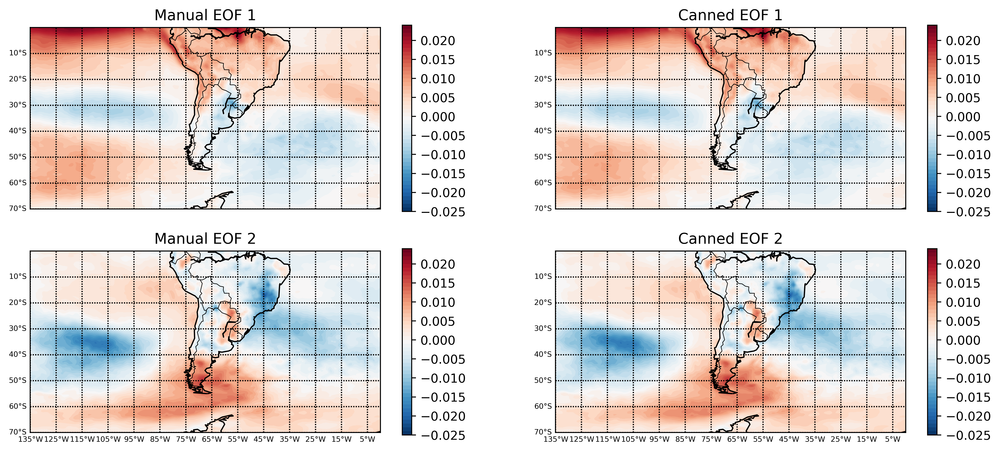

In [36]:
### plot the EOF
fig, axs = plt.subplots(2, 2, figsize=(14, 6), dpi=500)
(ax1, ax3), (ax2, ax4) = axs

# set colorbar
clevs = np.linspace(-0.025, 0.025, 50, endpoint=False)
#clevs = np.linspace(-1.25, 1.25, 1000, endpoint=False)

# plot for first EOF
cs1 = ax1.contourf(x, y, E[:,0].reshape(len(df.lat), len(df.lon)), clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax1)
map.drawcountries(ax=ax1)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax1)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax1)
ax1.set_title('Manual EOF 1')
fig.colorbar(cs1, ax=ax1)

# plot for second EOF
cs2 = ax2.contourf(x, y, E[:,1].reshape(len(df.lat), len(df.lon)), clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax2)
map.drawcountries(ax=ax2)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax2)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax2)
ax2.set_title('Manual EOF 2')
fig.colorbar(cs2, ax=ax2)

# plot for first EOF - Canned
cs3 = ax3.contourf(x, y, eofc[0], clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax3)
map.drawcountries(ax=ax3)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax3)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax3)
ax3.set_title('Canned EOF 1')
fig.colorbar(cs3, ax=ax3)

# plot for first EOF - Canned
cs4 = ax4.contourf(x, y, -1 * eofc[1], clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax4)
map.drawcountries(ax=ax4)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax4)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax4)
ax4.set_title('Canned EOF 2')
fig.colorbar(cs4, ax=ax4)

# plot legend
#cbar_ax = fig.add_axes([0.665, 0.1125, 0.025, 0.7675]) #position of color bar (left, bottom, width, height)
#cbar_ax = fig.colorbar(cs2, cax=cbar_ax, orientation='vertical') 
#cbar_ax.ax.set_ylabel('EOF Values', rotation=270, fontsize=12, labelpad=15)

* Reconstructed the anomaly temperature using First and Second EOF

In [37]:
### calculate the constructed anomaly temp. 
### eof 1
E1 = E[:, 0]
u1 = u[0, :]
eof1 = np.transpose(np.outer(E1, u1))
print('First EOF')
print(eof1.shape)
print(eof1[0, :])

print()

### eof 2
E2 = E[:, 1]
u2 = u[1, :]
eof2 = np.transpose(np.outer(E2, u2))
print('Second EOF')
print(eof2.shape)
print(eof2[0, :])

First EOF
(37, 30597)
[-0.02167997+0.j -0.02007632+0.j -0.01824702+0.j ... -0.03365301+0.j
 -0.03494624+0.j -0.03675118+0.j]

Second EOF
(37, 30597)
[ 0.01058569+0.j  0.01026326+0.j  0.00997991+0.j ... -0.01478463+0.j
 -0.01396178+0.j -0.01214564+0.j]


/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/contour.py:1578: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmax = z.max().astype(float)
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/contour.py:1579: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmin = z.min().astype(float)
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/numpy/ma/core.py:2820: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/contour.py:1578: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmax = z.max().astype(float)
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/contour.py:1579: ComplexWarning: Casting complex v

Text(0, 0.5, 'Temp. Anomaly (K)')

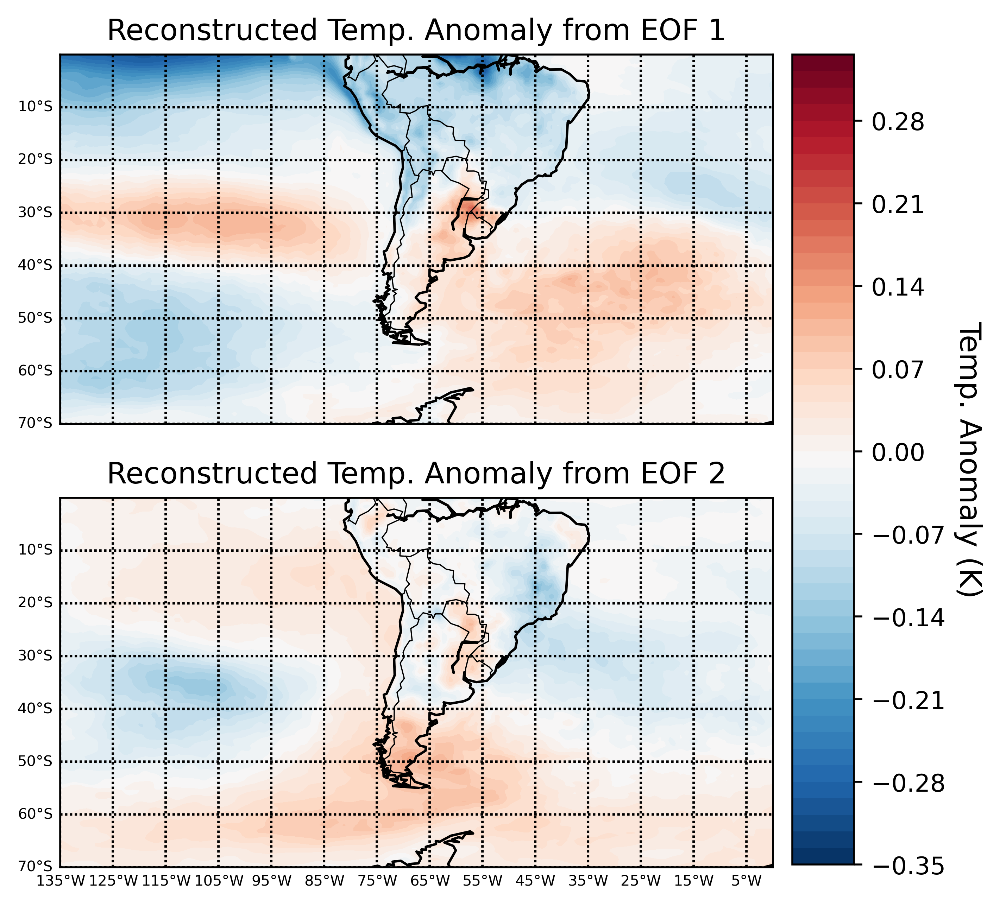

In [38]:
### plot map of reconstructed EOF 
fig, axs = plt.subplots(2, 1, figsize=(14, 6), dpi=500)
(ax1, ax2) = axs

# set colorbar
clevs = np.linspace(-0.35, 0.35, 50, endpoint=False)
#clevs = np.linspace(-1.25, 1.25, 1000, endpoint=False)

# plot for first EOF
cs1 = ax1.contourf(x, y, eof1[0,:].reshape(len(df.lat), len(df.lon)), clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax1)
map.drawcountries(ax=ax1)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax1)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax1)
ax1.set_title('Reconstructed Temp. Anomaly from EOF 1')

# plot for second EOF
cs2 = ax2.contourf(x, y, eof2[0,:].reshape(len(df.lat), len(df.lon)), clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax2)
map.drawcountries(ax=ax2)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax2)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax2)
ax2.set_title('Reconstructed Temp. Anomaly from EOF 2')

# plot legend
cbar_ax = fig.add_axes([0.665, 0.1125, 0.025, 0.7675]) #position of color bar (left, bottom, width, height)
cbar_ax = fig.colorbar(cs2, cax=cbar_ax, orientation='vertical') 
cbar_ax.ax.set_ylabel('Temp. Anomaly (K)', rotation=270, fontsize=12, labelpad=15)


* Shows plot of eigenvalues and variance explaiend by first 10 EOFs

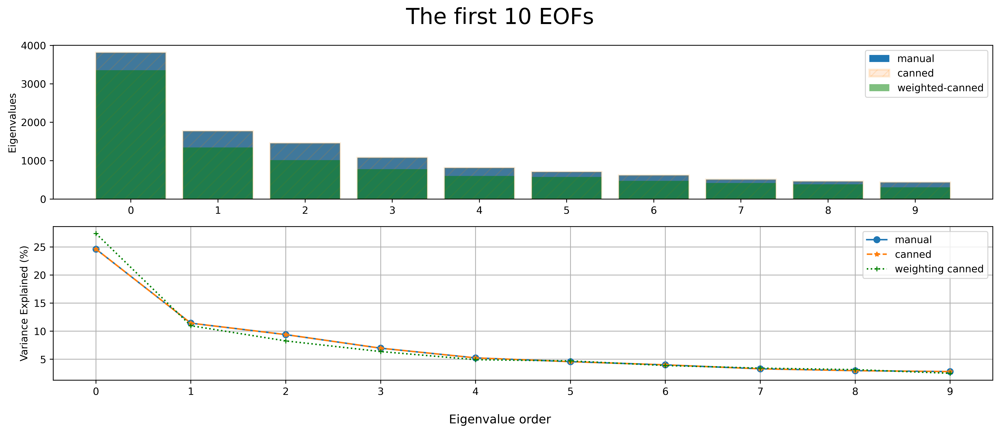

In [17]:
### plot eigen values and variamce explained
fig, axs = plt.subplots(2, 1, figsize=(14, 6), dpi=500)
(ax1, ax2) = axs

### plot eigenvalues for first 10 EOFS for manual
ax1.bar(range(len(l[:10])), l[:10], label='manual')
ax1.bar(range(len(lcs[:10])), lcs[:10], edgecolor='darkorange', linewidth = 2, hatch="//", label='canned', alpha=0.15)
ax1.bar(range(len(lc_weighting[:10])), lc_weighting[:10], color='green', label='weighted-canned', alpha=0.5)
ax1.set_xticks(range(min(range(len(l[:10]))), max(range(len(l[:10])))+1));
fig.suptitle('The first 10 EOFs', fontsize=22)
fig.supxlabel('Eigenvalue order')
ax1.set_ylabel('Eigenvalues')
ax1.legend()

### calculate variance explained
var_exp = l/(np.sum(l))*100
var_exp_canned = solver.explained_variance_ratio()
var_exp_canned_weigthing = solver_weighting.explained_variance_ratio()

ax2.plot(range(len(var_exp[:10])), var_exp[:10], marker='o', label = 'manual')
ax2.plot(range(len(var_exp_canned[:10])), var_exp_canned[:10]*100, marker='*', markersize = 5, label= 'canned', linestyle='--')
ax2.plot(range(len(var_exp_canned_weigthing[:10])), var_exp_canned_weigthing[:10]*100, marker='+', 
                        markersize = 5, label= 'weighting canned', linestyle=':', color='green')
ax2.set_xticks(range(min(range(len(var_exp[:10]))), max(range(len(var_exp[:10])))+1));
ax2.set_ylabel('Variance Explained (%)')
ax2.grid(True)
ax2.legend()

fig.set_tight_layout(True)

* Shows timeseries of the first and second PCs

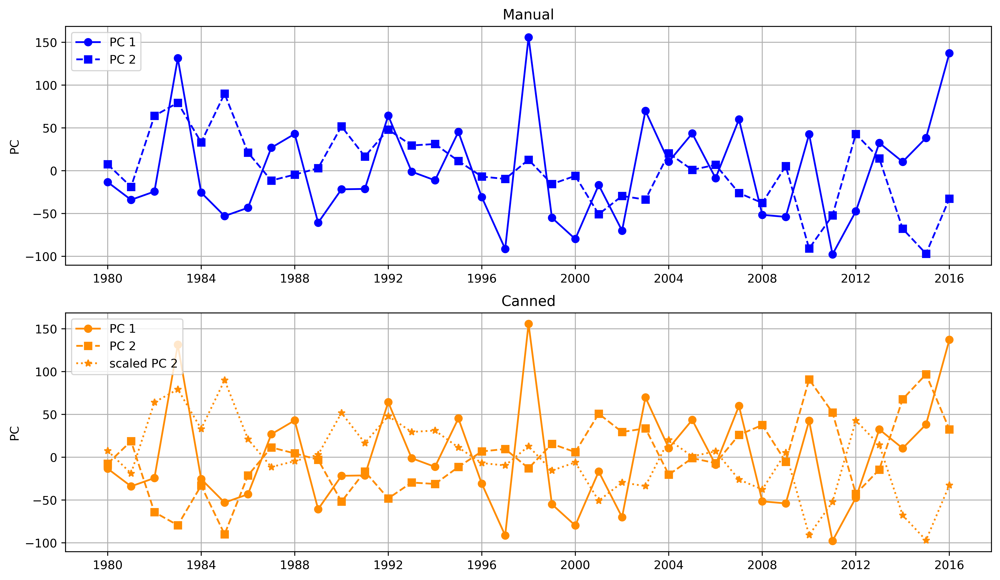

In [19]:
# Create the line plot for the first Two EOFs
fig, axs = plt.subplots(2, 1, figsize=(14, 8), dpi=500)
(ax1, ax2) = axs

ax1.plot(range_date, u[0,:], label='PC 1', marker='o', linestyle='-', color='b')
ax1.plot(range_date, u[1,:], label='PC 2', marker='s', linestyle='--', color='b')
ax1.set_ylabel('PC')
ax1.grid(True)
ax1.set_title('Manual')
ax1.legend()

ax2.plot(range_date, pcac[0, :], label='PC 1', marker='o', linestyle='-', color='darkorange')
ax2.plot(range_date, pcac[1, :], label='PC 2', marker='s', linestyle='--', color='darkorange')
ax2.plot(range_date, -1 * pcac[1, :], label='scaled PC 2', marker='*', linestyle=':', color='darkorange')
ax2.set_ylabel('PC')
ax2.set_title('Canned')
ax2.grid(True)
ax2.legend()

In [48]:
### Find three max. and min. year from the dominant PC

### maximum
max_yr_list = np.flip(np.argsort(u[0,:]))
print("Three Max. Year (Manual)")
for i in max_yr_list[0:3]:
    #print(i)
    print("PC = %.1f" % (u[0,i].real) + " in", range_date[i].year)

### minimum
min_yr_list = np.argsort(u[0,:])
print("Three Min. Year (Manual)")
for i in min_yr_list[0:3]:
    #print(i)
    print("PC = %.1f" % (u[0,i].real) + " in", range_date[i].year)

### maximum
max_yr_list_can = np.flip(np.argsort(pcac[0].values))
print()
print("Three Max. Year (Canned)")
for i in max_yr_list[0:3]:
    #print(i)
    print("PC = %.1f" % pcac[0,i].values + " in", range_date[i].year)

min_yr_list_can = np.argsort(pcac[0].values)
print("Three Min. Year (Canned)")
for i in min_yr_list_can[0:3]:
    #print(i)
    print("PC = %.1f" % pcac[0,i].values + " in", range_date[i].year)


Three Max. Year (Manual)
PC = 155.7 in 1998
PC = 137.2 in 2016
PC = 131.3 in 1983
Three Min. Year (Manual)
PC = -97.7 in 2011
PC = -91.3 in 1997
PC = -79.7 in 2000

Three Max. Year (Canned)
PC = 155.7 in 1998
PC = 137.2 in 2016
PC = 131.3 in 1983
Three Min. Year (Canned)
PC = -97.7 in 2011
PC = -91.3 in 1997
PC = -79.7 in 2000


* Shows map of average composite of tempertaure anomalies for each three maximum and minimum PC

In [27]:
### calculate composite three max and min EOF for manual
df_anom_mxave = (df_anom[18] + df_anom[36] + df_anom[3]) / 3
print(df_anom_mxave.shape)
df_anom_mnave = (df_anom[31] + df_anom[17] + df_anom[20]) / 3
print(df_anom_mnave.shape)

### calculate composite three max and min EOF for canned
df_anom_mxave_can = (df_anom[18] + df_anom[36] + df_anom[3]) / 3
print(df_anom_mxave_can.shape)
df_anom_mnave_can = (df_anom[31] + df_anom[17] + df_anom[20]) / 3
print(df_anom_mnave_can.shape)

(141, 217)
(141, 217)
(141, 217)
(141, 217)


Text(0, 0.5, 'Temp. Anomaly (K)')

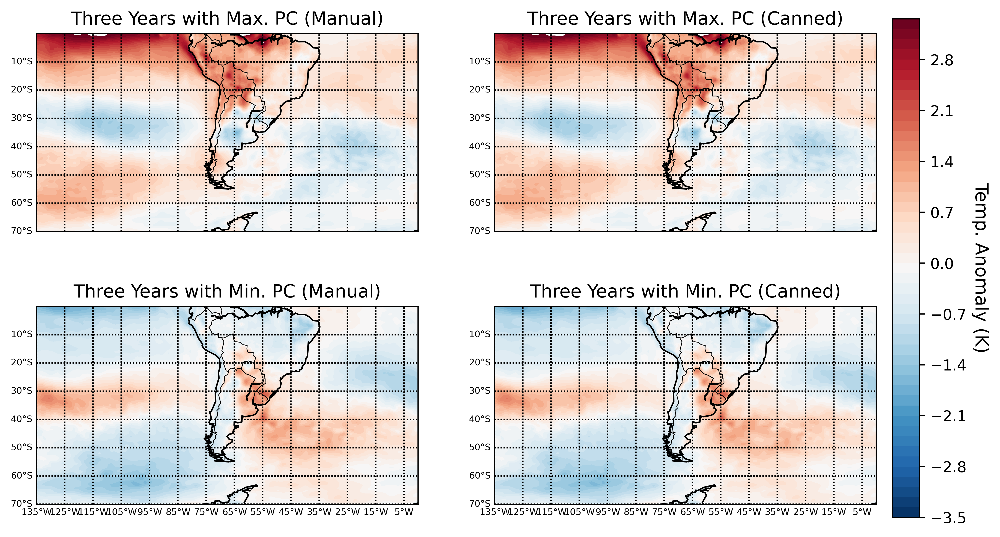

In [61]:
### plot composite map of temperature anomaly
fig, axs = plt.subplots(2, 2, figsize=(10, 6), dpi=500)
(ax1, ax3), (ax2, ax4) = axs

# set colorbar
clevs = np.linspace(-3.5, 3.5, 50, endpoint=False)

# plot for first EOF
cs1 = ax1.contourf(x, y, df_anom_mxave, clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax1)
map.drawcountries(ax=ax1)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax1)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax1)
ax1.set_title('Three Years with Max. PC (Manual)')

# plot for second EOF
cs2 = ax2.contourf(x, y, df_anom_mnave, clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax2)
map.drawcountries(ax=ax2)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax2)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax2)
ax2.set_title('Three Years with Min. PC (Manual)')

# plot for first EOF
cs3 = ax3.contourf(x, y, df_anom_mxave_can, clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax3)
map.drawcountries(ax=ax3)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax3)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax3)
ax3.set_title('Three Years with Max. PC (Canned)')

# plot for second EOF
cs4 = ax4.contourf(x, y, df_anom_mnave_can, clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax4)
map.drawcountries(ax=ax4)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax4)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax4)
ax4.set_title('Three Years with Min. PC (Canned)')

# plot legend
cbar_ax = fig.add_axes([0.915, 0.1125, 0.025, 0.7675]) #position of color bar (left, bottom, width, height)
cbar_ax = fig.colorbar(cs2, cax=cbar_ax, orientation='vertical') 
cbar_ax.ax.set_ylabel('Temp. Anomaly (K)', rotation=270, fontsize=12, labelpad=15)

#plt.tight_layout()


### 3. Perform Rotated EOF analysis

* Calculate Rotated EOF Anlysis use `xeofs` varimax

In [20]:
### compute rotate EOF

model = EOF(n_modes=37, standardize=True, use_coslat=False)
model.fit(df_anom_new, dim='time')
rot_var = EOFRotator(n_modes=37, power=1)
rot_var.fit(model)

### define the eigenvalue and variance explained
Er = rot_var.components() #EOF
lr = rot_var.explained_variance() #Eigenvalues
ur = rot_var.scores(normalized=False) #PC
print('Rotated EOFs')
print(Er.shape)
#print(Er)
print()
print('Rotated Eigenvalues')
print(lr.shape)
#print(lr)
print()
print('Rotated PC')
print(ur.shape)

Rotated EOFs
(37, 141, 217)

Rotated Eigenvalues
(37,)

Rotated PC
(37, 37)


* Plot rotated 10 eigenvalues of EOFs and their explained variance

/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/transforms.py:766: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)
/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/transforms.py:766: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


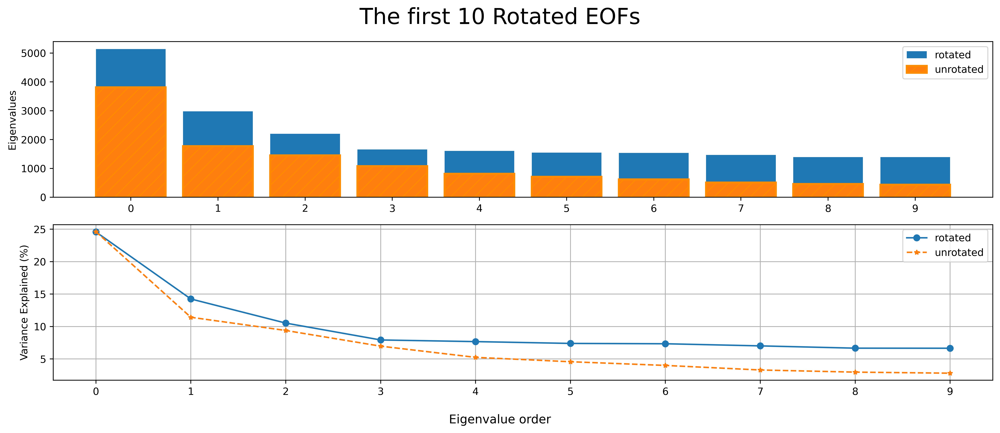

In [35]:
### plot eigen values and variamce explained
fig, axs = plt.subplots(2, 1, figsize=(14, 6), dpi=500)
(ax1, ax2) = axs

### plot eigenvalues for first 10 EOFS
ax1.bar(range(len(lr[:10])), lr[:10], label='rotated')
ax1.bar(range(len(lcs[:10])), lcs[:10], 
        edgecolor='darkorange', linewidth = 2, hatch="//", 
        label='unrotated', alpha=1.0)
ax1.set_xticks(range(min(range(len(lr[:10]))), max(range(len(lr[:10])))+1));
fig.suptitle('The first 10 Rotated EOFs', fontsize=22)
fig.supxlabel('Eigenvalue order')
ax1.set_ylabel('Eigenvalues')
ax1.legend()

### calculate variance explained
var_exp = lr[:10]/(np.sum(lr[:10]))*100
ax2.plot(range(len(var_exp[:10])), var_exp[:10], marker='o', label= 'rotated')
ax2.plot(range(len(var_exp_canned[:10])), var_exp_canned[:10]*100, 
        marker='*', markersize = 5, label= 'unrotated', linestyle='--')
ax2.set_xticks(range(min(range(len(var_exp[:10]))), max(range(len(var_exp[:10])))+1));
ax2.set_ylabel('Variance Explained (%)')
ax2.grid(True)
ax2.legend()


fig.set_tight_layout(True)

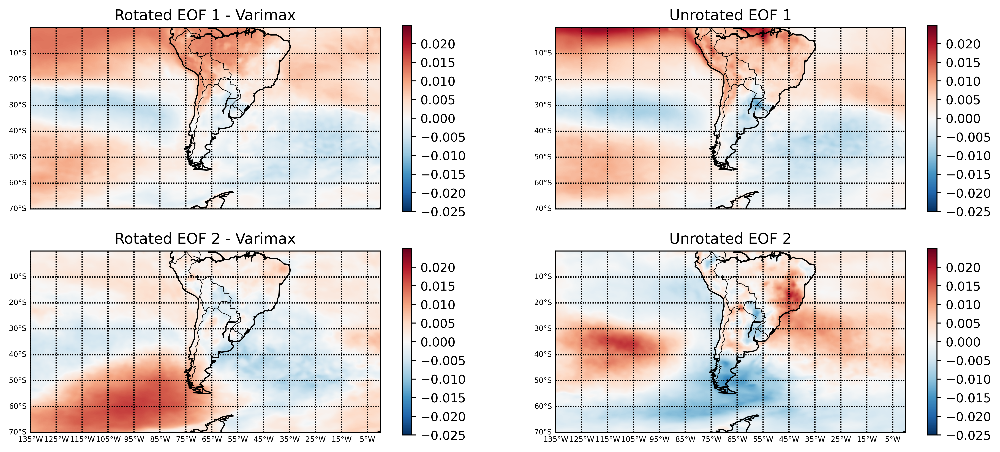

In [25]:
### plot the EOF
fig, axs = plt.subplots(2, 2, figsize=(14, 6), dpi=500)
(ax1, ax3), (ax2, ax4) = axs

# set colorbar
clevs = np.linspace(-0.025, 0.025, 1000, endpoint=False)
#clevs = np.linspace(-1.25, 1.25, 1000, endpoint=False)

# plot for first rEOF
cs1 = ax1.contourf(x, y, Er[0], clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax1)
map.drawcountries(ax=ax1)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax1)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax1)
ax1.set_title('Rotated EOF 1 - Varimax')
fig.colorbar(cs1, ax=ax1)

# plot for second rEOF
cs2 = ax2.contourf(x, y, Er[1], clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax2)
map.drawcountries(ax=ax2)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax2)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax2)
ax2.set_title('Rotated EOF 2 - Varimax')
fig.colorbar(cs2, ax=ax2)

# plot for first EOF
cs3 = ax3.contourf(x, y, eofc[0], clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax3)
map.drawcountries(ax=ax3)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax3)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax3)
ax3.set_title('Unrotated EOF 1')
fig.colorbar(cs3, ax=ax3)

# plot for second EOF
cs4 = ax4.contourf(x, y, eofc[1], clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax4)
map.drawcountries(ax=ax4)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax4)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax4)
ax4.set_title('Unrotated EOF 2')
fig.colorbar(cs2, ax=ax4)

# plot legend
#cbar_ax = fig.add_axes([0.665, 0.1125, 0.025, 0.7675]) #position of color bar (left, bottom, width, height)
#bar_ax = fig.colorbar(cs2, cax=cbar_ax, orientation='vertical') 
#cbar_ax.ax.set_ylabel('EOF Values', rotation=270, fontsize=12, labelpad=15)

* Obtained Rotated PC

/data/keeling/a/fsari2/miniconda3/envs/py3-01/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


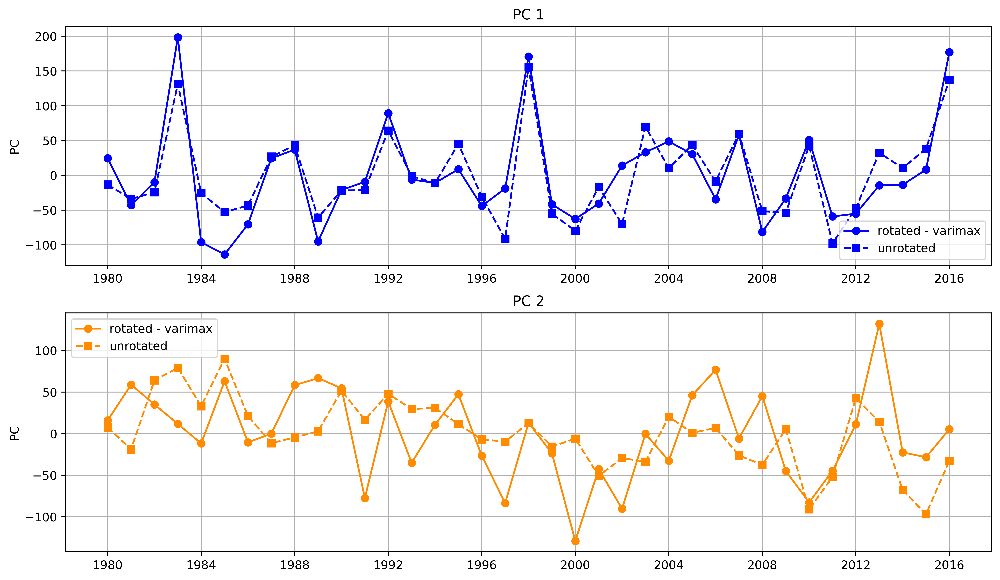

In [33]:
# Create the line plot for the first Two EOFs
fig, axs = plt.subplots(2, 1, figsize=(14, 8), dpi=500)
(ax1, ax2) = axs

ax1.plot(range_date, ur[0,:], label='rotated - varimax', marker='o', linestyle='-', color='b')
ax1.plot(range_date, u[0,:], label='unrotated', marker='s', linestyle='--', color='b')
ax1.set_ylabel('PC')
ax1.grid(True)
ax1.set_title('PC 1')
ax1.legend()

ax2.plot(range_date, ur[1,:], label='rotated - varimax', marker='o', linestyle='-', color='darkorange')
ax2.plot(range_date, u[1,:], label='unrotated', marker='s', linestyle='--', color='darkorange')
ax2.set_ylabel('PC')
ax2.set_title('PC 2')
ax2.grid(True)
ax2.legend()

* Select Three Max. and Min. Years from Rotated PC

In [23]:
### Find three max. and min. year from the dominant PC

### maximum
max_yr_list = np.flip(np.argsort(ur[0].values))
print('Rotated PC')
print("Three Max. Year")
for i in max_yr_list[0:3]:
    #print(i)
    print("PC = %.2f" % ur[0,i].values + " in", range_date[i].year)

### minimum
print()
min_yr_list = np.argsort(ur[0].values)
print("Three Min. Year")
for i in min_yr_list[0:3]:
    #print(i)
    print("PC = %.2f" % ur[0,i] + " in", range_date[i].year)


Rotated PC
Three Max. Year
PC = 198.24 in 1983
PC = 176.96 in 2016
PC = 170.66 in 1998

Three Min. Year
PC = -113.55 in 1985
PC = -96.05 in 1984
PC = -94.94 in 1989


* Shows map of average composite of tempertaure anomalies for each three maximum and minimum PC

In [28]:
### calculate composite three max and min EOF
df_anom_mxaver = (df_anom[3] + df_anom[36] + df_anom[18]) / 3
print(df_anom_mxaver.shape)
df_anom_mnaver = (df_anom[9] + df_anom[5] + df_anom[31]) / 3
print(df_anom_mnaver.shape)

(141, 217)
(141, 217)


Text(0, 0.5, 'Temp. Anomaly (K)')

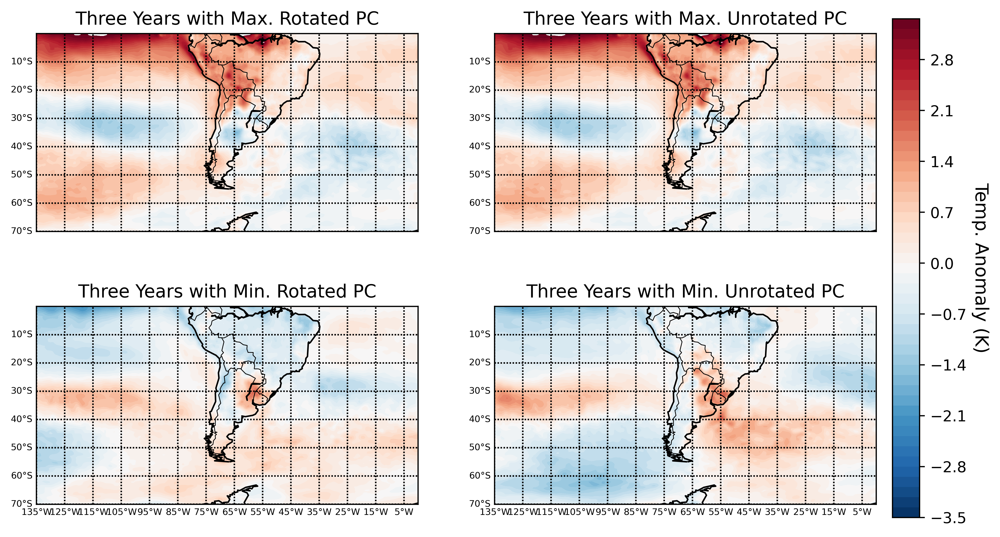

In [34]:
### plot map
fig, axs = plt.subplots(2, 2, figsize=(10, 6), dpi=500)
(ax1, ax3), (ax2, ax4) = axs

# set colorbar
clevs = np.linspace(-3.5, 3.5, 50, endpoint=False)

# plot for first rEOF
cs1 = ax1.contourf(x, y, df_anom_mxaver, clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax1)
map.drawcountries(ax=ax1)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax1)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax1)
ax1.set_title('Three Years with Max. Rotated PC')

# plot for second rEOF
cs2 = ax2.contourf(x, y, df_anom_mnaver, clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax2)
map.drawcountries(ax=ax2)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax2)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax2)
ax2.set_title('Three Years with Min. Rotated PC')

# plot for first EOF
cs3 = ax3.contourf(x, y, df_anom_mxave, clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax3)
map.drawcountries(ax=ax3)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax3)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,False], fontsize=6, ax=ax3)
ax3.set_title('Three Years with Max. Unrotated PC')

# plot for second EOF
cs4 = ax4.contourf(x, y, df_anom_mnave, clevs, cmap=plt.cm.RdBu_r)
map.drawcoastlines(ax=ax4)
map.drawcountries(ax=ax4)
parallels = np.arange(min(lats),max(lats),10.)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=6, ax=ax4)
meridians = np.arange(min(lons),max(lons),10.)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=6, ax=ax4)
ax4.set_title('Three Years with Min. Unrotated PC')

# plot legend
cbar_ax = fig.add_axes([0.915, 0.1125, 0.025, 0.7675]) #position of color bar (left, bottom, width, height)
cbar_ax = fig.colorbar(cs2, cax=cbar_ax, orientation='vertical') 
cbar_ax.ax.set_ylabel('Temp. Anomaly (K)', rotation=270, fontsize=12, labelpad=15)
